# Allen Cell Segmenter (Soma Segmentation)

Here is the link: https://www.allencell.org/segmenter.html

It includes iterative deep learning workflow which means the model can be improved based on labelled images.

After thresholding, there are multiple steps it needs to go through. First, hole filling and then watershed segmentation

In [39]:
import numpy as np
from aicssegmentation.core.MO_threshold import MO
# package for 3d visualization
from itkwidgets import view                              
from aicssegmentation.core.visual import seg_fluo_side_by_side,  single_fluorescent_view, segmentation_quick_view
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [16, 12]

# package for io 
from aicsimageio import AICSImage
from aicsimageio.writers import OmeTiffWriter

# function for core algorithm
from aicssegmentation.core.vessel import filament_2d_wrapper
from aicssegmentation.core.pre_processing_utils import intensity_normalization, image_smoothing_gaussian_3d, edge_preserving_smoothing_3d
from skimage.morphology import remove_small_objects     # function for post-processing (size filter)

In [40]:
FILE_NAME = 'forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_C10_0003_RGB_CSU 640.tif'
# FILE_NAME = 'forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_C10_0003_RGB_CSU 640.tif'

reader = AICSImage(FILE_NAME) 
IMG = reader.data[0,0,0,:,:,0]

print(IMG.shape)

Failed to parse XML for the provided file.
no element found: line 1, column 0


(2048, 2048)


In [41]:
################################
## PARAMETERS for intensity normalization ##
intensity_scaling_param = [2.5, 7.5]
################################
struct_img = intensity_normalization(IMG, scaling_param=intensity_scaling_param)

In [42]:
################################
## PARAMETERS for this step ##
f2_param = [[1, 0.15]]
################################
bw, object_for_debug = MO(IMG, global_thresh_method='tri', object_minArea=700, return_object=True)
# bw = filament_2d_wrapper(struct_img, f2_param)

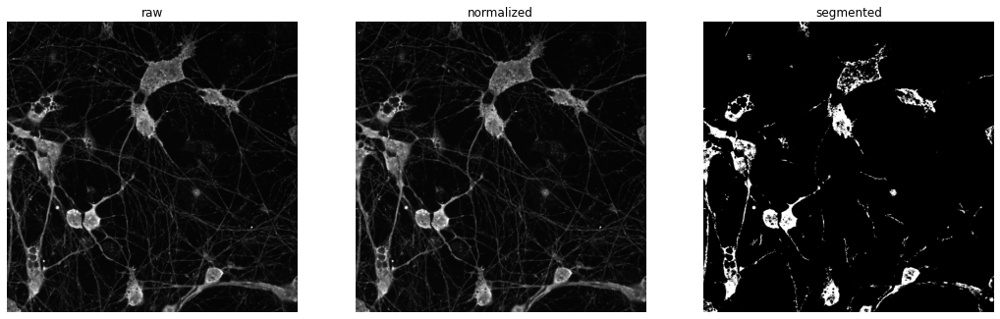

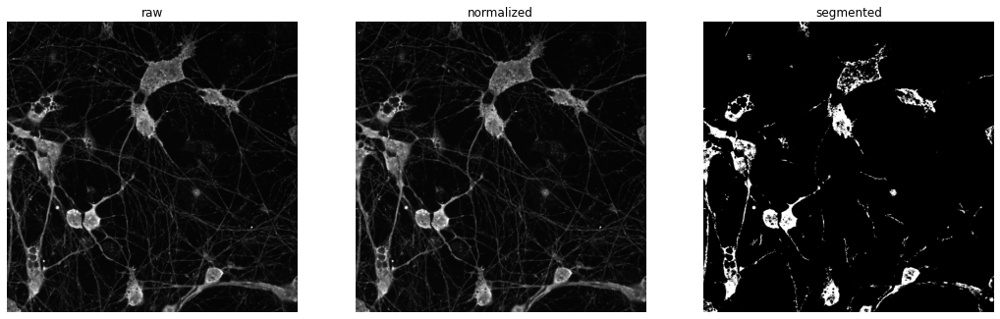

In [46]:
fig, (ax, ax2, ax3) = plt.subplots(1, 3, figsize=(18,16), dpi=72, facecolor='w', edgecolor='k')
ax.imshow(IMG, cmap=plt.cm.gray)
ax2.imshow(struct_img, cmap=plt.cm.gray)
ax3.imshow(bw, cmap=plt.cm.gray)
ax.axis('off')
ax2.axis('off')
ax3.axis('off')
ax.set_title("raw")
ax2.set_title("normalized")
ax3.set_title("segmented")
plt.show()
plt.savefig(f"outputImages/ACSsomaSegmentation_{FILE_NAME.split('/')[1].replace('.tif', '.png')}", bbox_inches='tight')


# Threshold's Otsu

It performs better than allen cell segmenter (atleast the pipeline that we tried). 

Here is the link: https://scikit-image.org/docs/0.24.x/auto_examples/segmentation/plot_thresholding.html

In [38]:
import cv2
from skimage.filters import threshold_otsu

In [47]:
FILE_NAME = 'forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_C10_0003_RGB_CSU 640.tif'
loaded_image = cv2.imread(FILE_NAME)
# FILE_NAME = 'forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_C10_0003_RGB_CSU 640.tif'


In [48]:
loaded_image = np.array(loaded_image, dtype=float)[:, :, 0]
thresh = threshold_otsu(loaded_image)
binary = loaded_image > thresh


<Figure size 4800x3600 with 0 Axes>

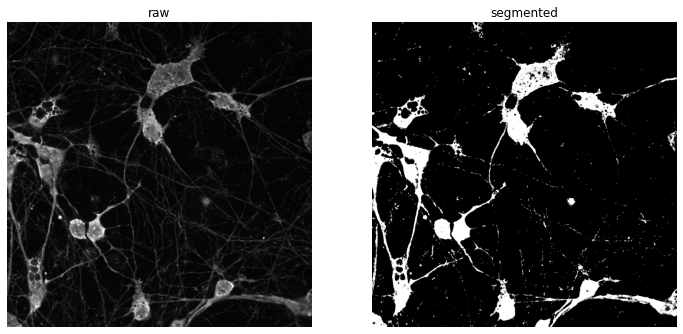

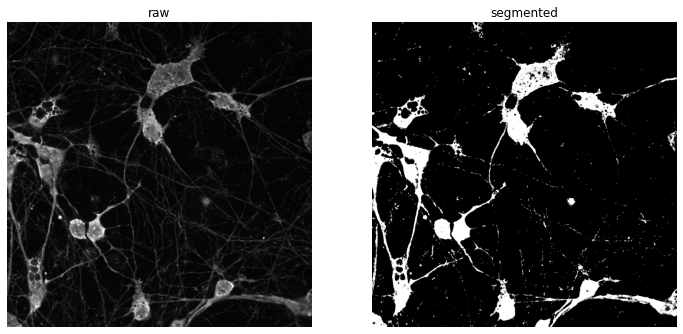

In [50]:
fig, (ax, ax3) = plt.subplots(1, 2, figsize=(12,16), dpi=72, facecolor='w', edgecolor='k')
ax.imshow(loaded_image, cmap=plt.cm.gray)
ax3.imshow(binary, cmap=plt.cm.gray)
ax.axis('off')
ax3.axis('off')
ax.set_title("raw")
ax3.set_title("segmented")
plt.show()
plt.savefig(f"outputImages/ThresholdOtsuSomaSegmentation_{FILE_NAME.split('/')[1].replace('.tif', '.png')}", bbox_inches='tight')

In [59]:
from scipy import ndimage

img_fill_holes = ndimage.binary_fill_holes(binary).astype(int)
# antibody for cRNA if RNA being transported little of Punta along into another place (motion of RNA within the axons in neurites)
# RNA in cytoplasm out of cell
# guide RNA all parts of it; FISH RNA is specifically to a pieces

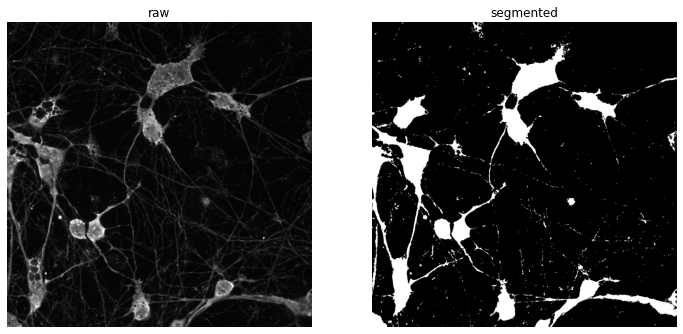

In [60]:
fig, (ax, ax3) = plt.subplots(1, 2, figsize=(12,16), dpi=72, facecolor='w', edgecolor='k')
ax.imshow(loaded_image, cmap=plt.cm.gray)
ax3.imshow(img_fill_holes, cmap=plt.cm.gray)
ax.axis('off')
ax3.axis('off')
ax.set_title("raw")
ax3.set_title("segmented")
plt.show()
plt.savefig(f"outputImages/ThresholdOtsuSomaSegmentation_{FILE_NAME.split('/')[1].replace('.tif', '.png')}", bbox_inches='tight')

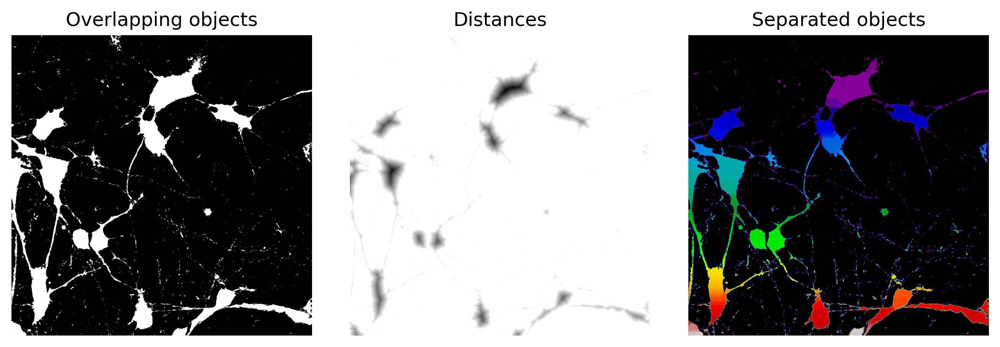

In [67]:
distance = ndi.distance_transform_edt(img_fill_holes)
coords = peak_local_max(distance, footprint=np.ones((3, 3)), labels=img_fill_holes)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
labels = watershed(-distance, markers, mask=img_fill_holes)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(img_fill_holes, cmap=plt.cm.gray)
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray)
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
ax[2].set_title('Separated objects')

for a in ax:
    a.set_axis_off()

fig.tight_layout()
plt.show()

# Cellpose

Here is the link: https://cellpose.readthedocs.io/en/latest/

Very sensitive to diameter parameter.

The issue here is it segments lots of neurites as well considering it as a nuclear/cytoplasmic region.

In [70]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io

<Figure size 4800x3600 with 0 Axes>

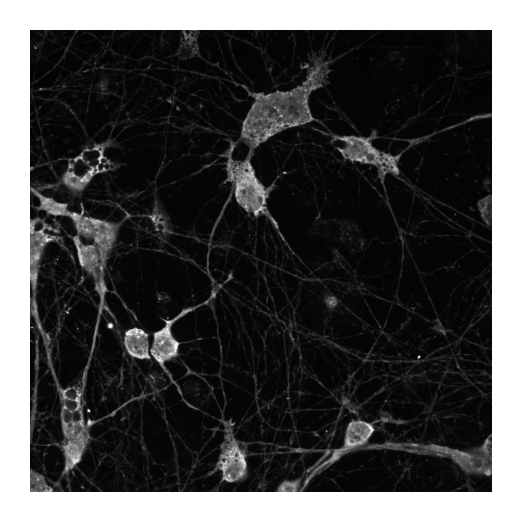

In [52]:
# view 1 image
filename = FILE_NAME
img = io.imread(FILE_NAME)
plt.figure(figsize=(2,2))
plt.imshow(img)
plt.axis('off')
plt.show()

In [53]:
from cellpose import models, io
model = models.Cellpose(gpu=False, model_type='cyto')
channels = [[2,3], [0,0], [0,0]]
img = io.imread(filename)
masks, flows, styles, diams = model.eval(img, diameter=200, channels=[0, 0])

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


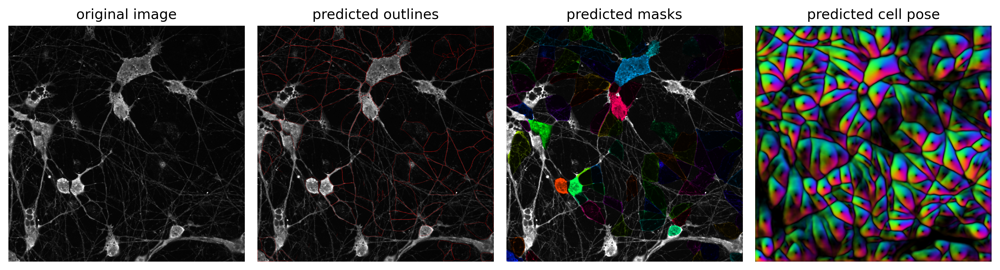

In [54]:
# DISPLAY RESULTS
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img, masks, flows[0], channels=[0, 0])
plt.tight_layout()
plt.show()

# PyImageJ

Link: https://py.imagej.net/en/latest/

This is the python version of ImageJ. It includes most of the functionality. It follows similar structure as Otsu's threshold method. However here we focus on ImajeJ tool as apposed to scikit functionality,

In [26]:
## read files
import nd2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.filters import threshold_otsu
import cv2

def read_file(image_file, gray_scale=False):
    if 'nd2' in image_file:
        nd2image = nd2.imread(image_file)
        image_src = nd2image[0].transpose()[:, :, 0]
    else:
        image_src = cv2.imread(image_file)
    if gray_scale:
        image_src = cv2.cvtColor(image_src, cv2.COLOR_BGR2GRAY)
    else:
        image_src = cv2.cvtColor(image_src, cv2.COLOR_BGR2RGB)
    return image_src

import os
os.environ["JAVA_HOME"] = "/Users/dadua2/anaconda3/envs/napari-env/lib/jvm"

import imagej
import scyjava as sj

# initialize ImageJ
ij = imagej.init('sc.fiji:fiji', mode='headless')
print(f"ImageJ version: {ij.getVersion()}")

ImageJ version: 2.16.0/Inactive


In [27]:
raw_image_filename = "forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_crop_GA3_cellbodythreshold_C10_0003_RGB_CSU 640.tif"
raw_image_filename = "forFaraz/20240913_094939_873__WellC10_ChannelCSU 405,CSU 488,CSU 640_Seq0007_C10_0003_RGB_CSU 640.tif"

loaded_image = read_file(
    raw_image_filename,
    gray_scale=False
)

In [28]:
# import nd2
# image_file = "/Users/dadua2/Projects/DAPISegmentation/20240913_094939_873__WellC05_ChannelCSU 405,CSU 488,CSU 640_Seq0002.nd2"
# nd2image = nd2.imread(image_file)
# loaded_image = nd2image[4]# [2]# .transpose()[0, 0, 0]

In [29]:
import xarray
xcells = xarray.DataArray(loaded_image.transpose(2,0,1), name='xcells', dims=('ch', 'row', 'col'))
# xcells = xarray.DataArray(loaded_image, name='xcells', dims=('ch', 'row', 'col'))

# print some basic info
print(f"name: {xcells.name}\ndimensions: {xcells.dims}\nshape: {xcells.shape}")

name: xcells
dimensions: ('ch', 'row', 'col')
shape: (3, 2048, 2048)


Operating in headless mode - the original ImageJ will have limited functionality.


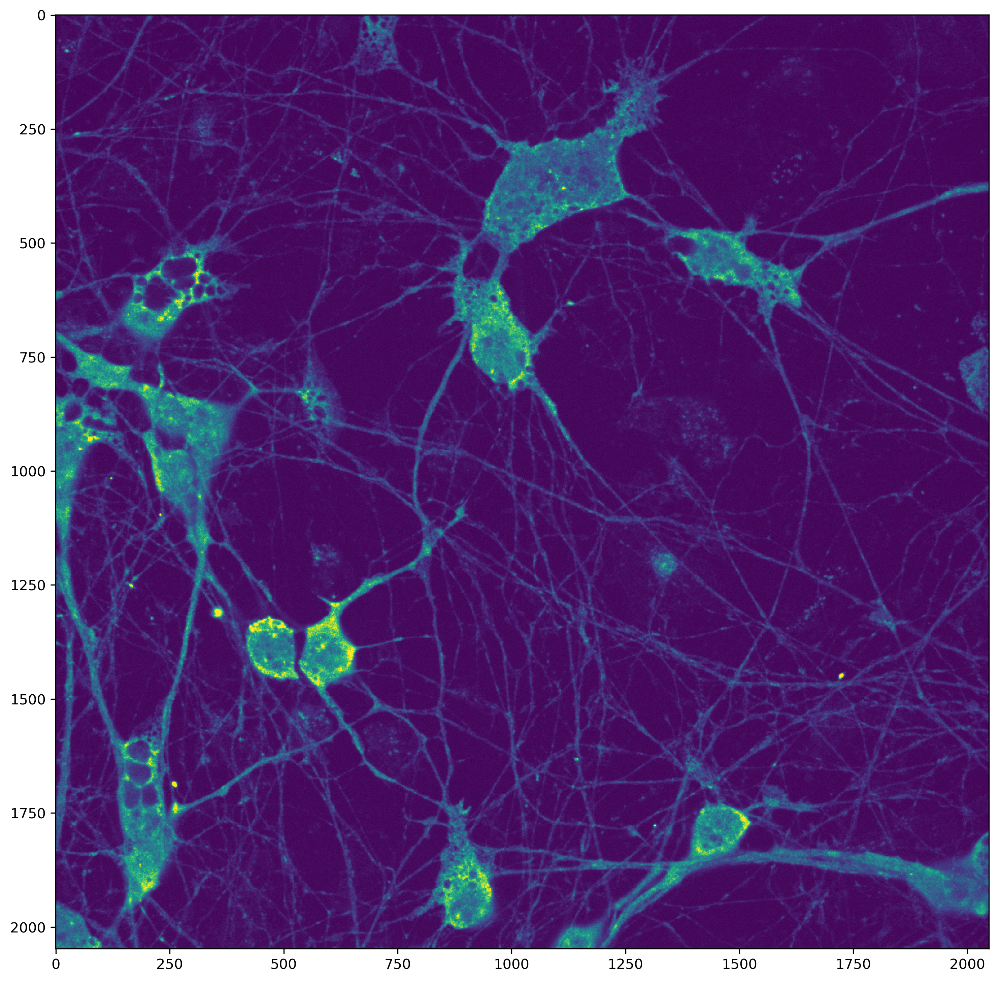

In [30]:
# slice out an image plane.
c, z = 1, 35
cells_slice = xcells[0,:,:]
ij.py.show(cells_slice)
jslice = ij.py.to_java(cells_slice.values)

In [31]:
# preprocess with edge-preserving smoothing.
HyperSphereShape = sj.jimport("net.imglib2.algorithm.neighborhood.HyperSphereShape")
# smoothed = ij.op().run("create.img", jslice)
# ij.op().run("filter.median", ij.py.jargs(smoothed, cells_slice.values, HyperSphereShape(5)))
# ij.py.show(smoothed)

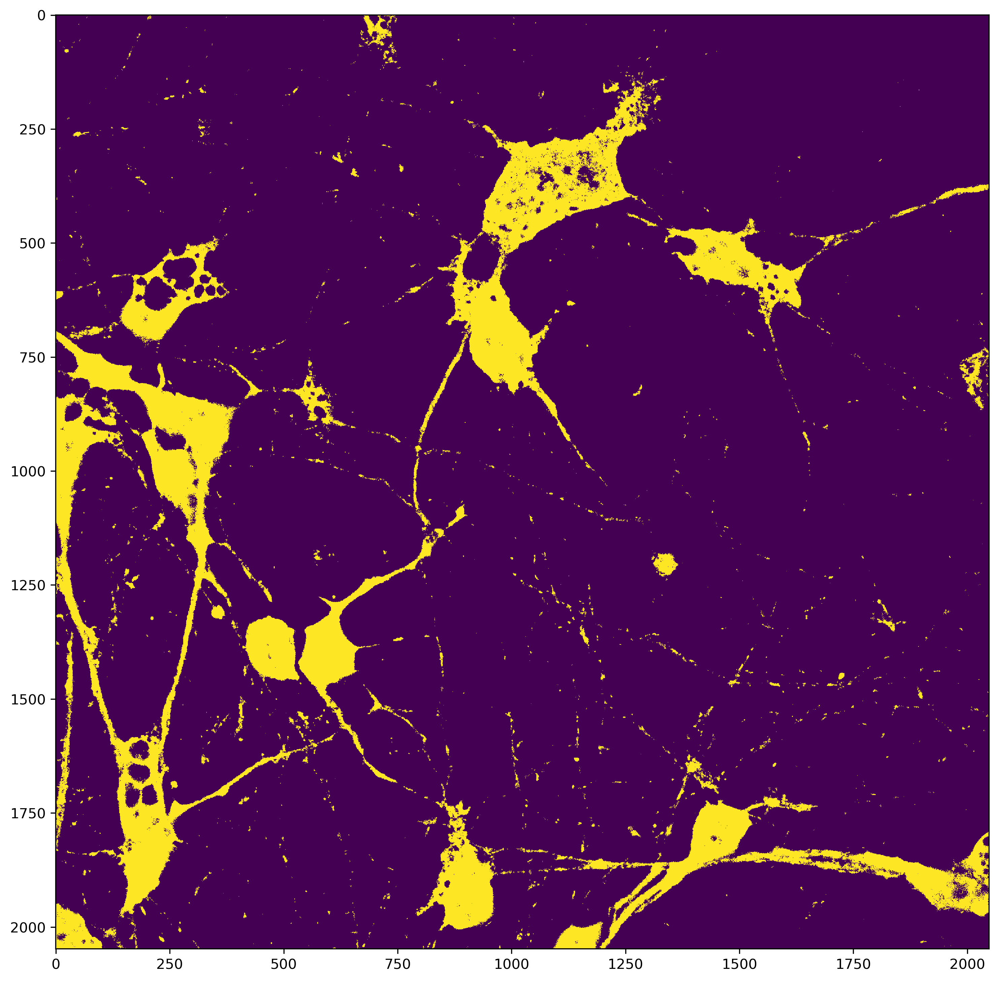

In [32]:
# threshold to binary mask.
mask = ij.op().run("threshold.otsu", jslice)
ij.py.show(mask)

In [56]:
# clean up the binary mask.
mask = ij.op().run("morphology.dilate", mask, HyperSphereShape(1))
mask = ij.op().run("morphology.fillHoles", mask)
ij.py.show(mask)

TypeError: only integer scalar arrays can be converted to a scalar index

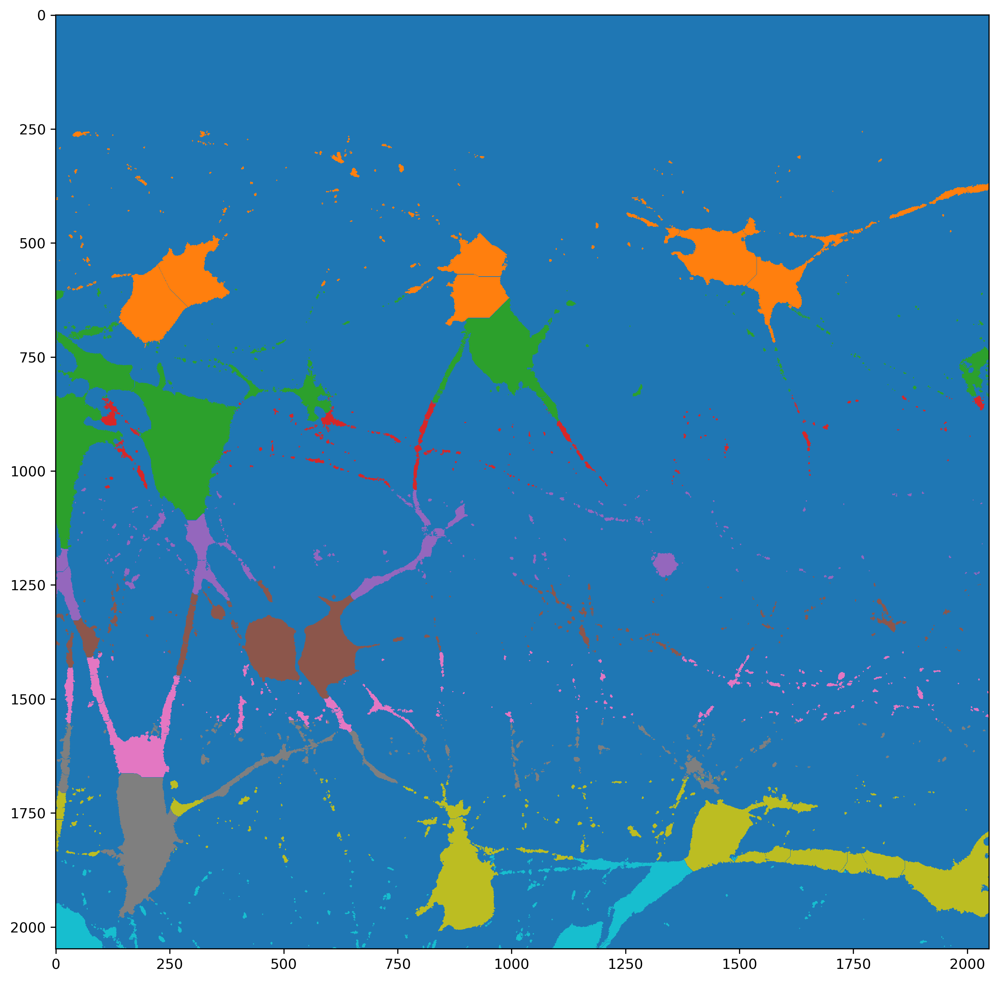

In [55]:
# Watershed: mask to labeling.
use_eight_connectivity = True
draw_watersheds = True
sigma = 10
args = ij.py.jargs(None, mask, use_eight_connectivity, draw_watersheds, sigma, mask)
labeling = ij.op().run("image.watershed", args)
ij.py.show(labeling.getIndexImg(), cmap='tab10')

In [ ]:
# calculate statistics.

from collections import defaultdict
from pandas import DataFrame

Regions = sj.jimport("net.imglib2.roi.Regions")
LabelRegions = sj.jimport("net.imglib2.roi.labeling.LabelRegions")

def compute_stats(region, img, stats):
    samples = Regions.sample(region, img)
    stats["area"].append(ij.op().run("stats.size", samples).getRealDouble())
    stats["mean"].append(ij.op().run("stats.mean", samples).getRealDouble())
    min_max = ij.op().run("stats.minMax", samples)
    stats["min"].append(min_max.getA().getRealDouble())
    stats["max"].append(min_max.getB().getRealDouble())
    centroid = ij.op().run("geom.centroid", region)
    stats["centroid"].append(tuple(centroid.getDoublePosition(d) for d in range(centroid.numDimensions())))
    stats["median"].append(ij.op().run("stats.median", samples).getRealDouble())
    stats["skewness"].append(ij.op().run("stats.skewness", samples).getRealDouble())
    stats["kurtosis"].append(ij.op().run("stats.kurtosis", samples).getRealDouble())

regions = LabelRegions(labeling)
stats_ops = defaultdict(list)
for region in regions:
    compute_stats(region, jslice, stats_ops)
df_ops = DataFrame(stats_ops)
df_ops